# Cluster_Attribute_SuperClustering_0901.ipynb
   - Cluster_Attribute_SuperClustering_0901.ipynb by Shiladitya

In [33]:
import pandas as pd, numpy as np

pd.set_option("display.max_rows", None)
pd.set_option("display.max_column", None)
path = 'C:\\users\\iny2819\\kroger\\Data\\' 

### Cluster Attribute Value Counts

In [2]:
clust_itm_atb = pd.read_csv( path + 'AttributeData_Itemwise_Clustering_500K_081723.csv', dtype='unicode') # (320846, 274)

In [58]:
#clust_itm_atb['ClusterLabel'].value_counts(dropna =  False).sort_index() 
len(df_atb['ClusterLabel'].value_counts(dropna =  False).sort_index() )


7158

In [9]:
clust_itm_atb['ClusterLabel'].value_counts(dropna =  False)

0       1306
1       1145
2       1086
3       1085
4        991
5        938
6        909
8        844
7        841
9        830
10       818
11       818
12       804
13       789
14       776
15       762
16       748
17       745
18       727
19       723
20       679
21       679
22       671
23       642
24       613
25       611
26       604
27       599
28       592
29       570
30       559
31       546
32       541
33       533
35       526
37       521
36       521
38       519
39       517
34       514
40       510
41       498
43       486
42       480
44       479
46       473
45       473
47       471
48       459
50       455
49       455
52       452
53       446
54       445
51       444
55       443
56       440
57       436
59       429
58       429
60       424
61       421
62       421
63       410
64       407
65       405
66       402
67       401
68       401
69       400
71       395
70       395
72       393
73       390
74       387
75       386
76       382

In [7]:
clust_itm_atb.columns 

Index(['GTIN_NO', 'ClusterLabel', 'Cluster Name', 'Cluster Size',
       'Method of Sweetening', 'Level of Sugar/Sucrose/Sweetener Claim',
       'Whole Grains - Contained in Product', 'Flavor(s)',
       'Milk Product/Substitute', 'Cheese Product Type',
       ...
       'Grouper and its Derivatives', 'Trout and its Derivatives',
       'Dory fish and its derivatives', 'Goat Milk',
       'Cutlassfish and its derivatives', 'Wolffish and its derivatives',
       'Chinquapins and Their Derivatives', 'Pili Nuts and Their Derivatives',
       'Ginkgo Nuts and Their Derivatives', 'Bonito fish and its derivatives'],
      dtype='object', length=274)

In [16]:
clust_itm_atb.head()

,GTIN_NO,ClusterLabel,Cluster Name,Cluster Size,Method of Sweetening,Level of Sugar/Sucrose/Sweetener Claim,Whole Grains - Contained in Product,Flavor(s),Milk Product/Substitute,Cheese Product Type,...,Grouper and its Derivatives,Trout and its Derivatives,Dory fish and its derivatives,Goat Milk,Cutlassfish and its derivatives,Wolffish and its derivatives,Chinquapins and Their Derivatives,Pili Nuts and Their Derivatives,Ginkgo Nuts and Their Derivatives,Bonito fish and its derivatives
0,697334409960,6369,"DIY ELECTRICAL,MODELS",12,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,196093419826,1020,"ACCENT FURNITURE,WALL ART,SCHOOL SUPPLIES,CUTT...",65,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,89734005116,559,"750ML RED PREM WINES $8-14.99,750ML RED LUXURY...",104,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,41226893304,6873,"MENS SS KNIT SHIRT,MENS LS KNIT SHIRT",11,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,766572228494,306,"SALMON FR - ATLANTIC,SMOKED SALMON,SALMON FR V...",171,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [44]:
resx = clust_itm_atb.groupby('ClusterLabel', as_index = False).apply(lambda x:{i: dict(x[i].value_counts()/len(x)) for i in atb_cols})

In [45]:
resx.tail()

,ClusterLabel,None
7153,995,NaN
7154,996,NaN
7155,997,NaN
7156,998,NaN
7157,999,NaN


In [12]:
resx.shape

(7158, 2)

In [22]:
clust_itm_atb.dtypes

GTIN_NO                                                                   object
ClusterLabel                                                              object
Cluster Name                                                              object
Cluster Size                                                              object
Method of Sweetening                                                      object
Level of Sugar/Sucrose/Sweetener Claim                                    object
Whole Grains - Contained in Product                                       object
Flavor(s)                                                                 object
Milk Product/Substitute                                                   object
Cheese Product Type                                                       object
Juice Percentage                                                          object
Level of Cooking                                                          object
Genre                       

In [20]:
clust_itm_atb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320846 entries, 0 to 320845
Columns: 274 entries, GTIN_NO to Bonito fish and its derivatives
dtypes: object(274)
memory usage: 670.7+ MB


In [23]:
df_atb = clust_itm_atb.copy()

In [24]:
df_atb['ClusterLabel'] = df_atb['ClusterLabel'].astype(int)

In [31]:
print(grp.groups)

{0: [446, 796, 866, 873, 1833, 1880, 2233, 2402, 2756, 2872, 3019, 3097, 3374, 3553, 3877, 3916, 3994, 4680, 4690, 4756, 4844, 4967, 5243, 6306, 6824, 6914, 7072, 7096, 7113, 7544, 8120, 8145, 10102, 10115, 10428, 10495, 10742, 10883, 10989, 11166, 11271, 11799, 11916, 11957, 12303, 12462, 12507, 12713, 12748, 13083, 13196, 13229, 13462, 13488, 13513, 14043, 14048, 14222, 14257, 14345, 14499, 14810, 14892, 14967, 14994, 15028, 15301, 15350, 15417, 15458, 15505, 16007, 16328, 16415, 16430, 16884, 17138, 17535, 17730, 17968, 18258, 18651, 18701, 19400, 19412, 19951, 19954, 20067, 20401, 20595, 20906, 21102, 21295, 21509, 22120, 22276, 22455, 23269, 23475, 23679, ...], 1: [194, 218, 775, 946, 1751, 1868, 2108, 2303, 2451, 2622, 2692, 3306, 4349, 4799, 5359, 5694, 5697, 5867, 6090, 6138, 6219, 6254, 7260, 7324, 7780, 8105, 8209, 8260, 8500, 8518, 8539, 9215, 9389, 9577, 9871, 10174, 10258, 10332, 10670, 11116, 11149, 11755, 11888, 12032, 12095, 12100, 12216, 12236, 12318, 12547, 12715, 130

In [35]:
df_atb[df_atb['ClusterLabel'] < 10].head(10)

,GTIN_NO,ClusterLabel,Cluster Name,Cluster Size,Method of Sweetening,Level of Sugar/Sucrose/Sweetener Claim,Whole Grains - Contained in Product,Flavor(s),Milk Product/Substitute,Cheese Product Type,Juice Percentage,Level of Cooking,Genre,Color,Size Description,Card Is Closed Loop,Denomination of Card,Card Processor,Card is General Purpose Reloadable (GPR),Value of Card (Fixed or Variable),Other Size Description,Whole Grain Percent,Other Color,Item Bone In,USDA Meat Grade,Type of Processing Required at Store Level,Harvest Type,In Store Prepared/Packaged,Boneless Claim,Intended to be Used as a Topping or Ingredient,Consumer Lifestage,Age Restricted,Rating,Shelf Life of Product without Expiration Date on Package,Recommended Shelf Life Once Seal Broken on Packaging,Floral Container Type,Potted Plant,Shipping Material,Is Item Intended for Human Consumption?,Pot/Planter Size - Liquid Measure,Product is Labeled with an FDA Approved National Drug Code (NDC),Scent,Alcohol Proof,Type of Spirit,Consumer Unit Resealable,Type of Alcoholic Beverage Content,Artist,Other Floral Container Type,Type of Alcoholic Cordial/Syrup,Type of Tobacco,Fee Printed on Card,Variable Denomination of Card Maximum Amount,Minutes on Card,Data Allowance,Type of Airtime Card,Sold only at Kroger Fuel Centers,Type of Phone Card,Card Reloadable,Texts Allowance,Telecom Carrier,Pseudoephedrine (PSE) Amount in package,Type of Beer,Banner Name,ATI_TIP_KIT_ICD_VLU,ASBD_ACU_PDT_HGT_IN_INCH,ASBD_ACU_PDT_LTH_IN_INCH,ASBD_ACU_PDT_WTH_IN_INCH,ASB_REQ_VLU,AVG_WTTG_VLU,BTR_REQ_VLU,BRD_ANM_TYP_VLU,BLM_SSON_VLU,CORD_LTH_TX,FIN_VLU,HIN_ZNE_VLU,LGT_REQ_VLU,MTL_VLU,VND_BRN_NAM,GLU_FRE_CLM_VLU,LVL_OF_NON_GMO_CLM_VLU,MIN_DAYS_OF_SHF_LIF_AT_WHS_DAYS,NET_CONT_EQV_UOM_VIP_TO_KRG_UOM,NON_GMO_PDT_FL,ORG_CLM_VLU,RDM_WGT_FL,CER_FOR_POV_DIET_FL,LIV_NAT_ELG_FL,PDT_FRE_FRO_VLU,SRV_CNT_VLU,SYP_RLF_VLU,TPT_CLS_VLU,INE_USE_OF_PDT_TX,NO_OF_SERV_PER_PKG_NO,SIZ_QY,SNAP_ELG_FL,TYP_OF_LBL_VLU,ALH_FL,HAZ_FL,IS_EDBL_VLU,IS_TPCL_VLU,NUTRI_CALR,SBSP_ITM,KRG_OWN_IS_CHEM_VLU,KRG_OWN_IS_RAW_VLU,SHF_LIF_QY,ASBD_ACU_PDT_WGT_IN_LBS,BGR_ICD_VLU,BTR_ICD_VLU,BTR_TYP_VLU,BPA_FRE_VLU,CPC_IN_OZ,CLX_DSC,CVR_ARA_SQR_FT,FLV_DSC,INDR_OR_OUTD_VLU,MFR_WTY_LTH_OF_TM_IN_MON,NON_STK_VLU,SCT_DSC,TPT_THS_IN_DGE_FEH,TOY_TYP_VLU,VEH_TYP_VLU,ORG_TRD_ITM_VLU,Shellfish,Milk and its Derivatives,Fish and Their Derivatives,Eggs and Their Derivatives,Crustaceans and Their Derivatives,Tree Nuts and Their Derivatives,Sulfur Dioxide and Sulfits,Peanuts and Their Derivatives,Sesame Seeds and Their Derivatives,Soybean and its Derivatives,Wheat and Their Derivatives,Corn and Its Derivatives,Other gluten Containing Grain and Gluten Containing Grain Products,Does Not Contain Declaration Obligatory Allergens,Sunflower Seeds and Their Derivatives,Carrots and Their Derivatives,Celery and its Derivatives,Cereals and Their Derivatives,Barley and Barley Products,Seed Products,Rye and Their Derivatives,Oats,Almond and Almond Products,"CONTAINS TRACES OF TREE NUTS, I.E. ALMONDS, VARIOUS KINDS OF TREE NUTS",Coconuts and Their Derivatives,Lactose,Pod Fruits and Their Derivatives,Molluscs and Their Derivatives,Poppy Seeds and Their Derivatives,Benzyl Alcohol,Anise Alcohol,Amylcinnamyl Alcohol,Cashew and Cashew Products,Cocoa and its Derivatives,Walnut and Walnut Products,Glutamate and Their Derivatives,Mustard and its Derivatives,Pecan Nut and Pecan Nut Products,Macadamia Nut and Macadamia Nut Products,1-Naphthol,Queensland Nut and Queensland Nut Products,Pine Nut and Their Derivatives,Chicken Meat and Their Derivatives,Pork and its Derivatives,Salmon and its Derivatives,Sole and its Derivatives,Hazelnut and Hazelnut Products,Citronellol,Beef and its Derivatives,Lupine and its Derivatives,"1,3-Bis-(2,4-diaminophenoxy)propane",Pistachio and Pistachio Products,Brazil Nut and Brazil Nut Products,d-Limonene,Coumarin,Coriander and its Derivatives,Spelt and Spelt Products,Peas and Pea Products,Kamut,Linalool,Citral,Cod and its Derivatives,Pulses,Triticale and Th

In [26]:
grp = df_atb[df_atb['ClusterLabel'] < 10].groupby('ClusterLabel')
grp.items()

AttributeError: 'DataFrameGroupBy' object has no attribute 'items'

In [29]:
print( df_atb[df_atb['ClusterLabel'] < 10].groupby('ClusterLabel'))

In [34]:
grp.apply(lambda x:{i: dict(x[i].value_counts()/len(x)) for i in atb_cols})

ClusterLabel
0    {'Method of Sweetening': {}, 'Level of Sugar/S...
1    {'Method of Sweetening': {}, 'Level of Sugar/S...
2    {'Method of Sweetening': {'NONE': 0.0709023941...
3    {'Method of Sweetening': {}, 'Level of Sugar/S...
4    {'Method of Sweetening': {}, 'Level of Sugar/S...
5    {'Method of Sweetening': {}, 'Level of Sugar/S...
6    {'Method of Sweetening': {}, 'Level of Sugar/S...
7    {'Method of Sweetening': {'SUGAR': 0.085612366...
8    {'Method of Sweetening': {}, 'Level of Sugar/S...
9    {'Method of Sweetening': {}, 'Level of Sugar/S...
dtype: object

In [27]:
for name,group in grp:
   print (name)  # year 
   print (group) # subset of DF with year from 'name'

0


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [19]:
clust_itm_atb[[int('ClusterLabel') < 10]].groupby('ClusterLabel')
# df_lable[df_lable['Source'] == "Test"]

ValueError: invalid literal for int() with base 10: 'ClusterLabel'

In [3]:
atb_cols = clust_itm_atb.columns[4:]
res = pd.DataFrame(clust_itm_atb.groupby('ClusterLabel').apply(lambda x:{i: dict(x[i].value_counts()/len(x)) for i in atb_cols})).reset_index()

In [16]:
res.shape

(7158, 2)

In [4]:
res.head()

,ClusterLabel,0
0,0,"{'Method of Sweetening': {}, 'Level of Sugar/S..."
1,1,"{'Method of Sweetening': {}, 'Level of Sugar/S..."
2,10,{'Method of Sweetening': {'SUGAR': 0.097799511...
3,100,"{'Method of Sweetening': {}, 'Level of Sugar/S..."
4,1000,{'Method of Sweetening': {'NONE': 0.0151515151...


In [6]:
res['ClusterLabel'].value_counts(dropna = False)

0       1
529     1
53      1
5299    1
5298    1
5297    1
5296    1
5295    1
5294    1
5293    1
5292    1
5291    1
5290    1
5289    1
5300    1
5288    1
5287    1
5286    1
5285    1
5284    1
5283    1
5282    1
5281    1
5280    1
528     1
5279    1
530     1
5301    1
5277    1
5314    1
5324    1
5323    1
5322    1
5321    1
5320    1
532     1
5319    1
5318    1
5317    1
5316    1
5315    1
5313    1
5302    1
5312    1
5311    1
5310    1
531     1
5309    1
5308    1
5307    1
5306    1
5305    1
5304    1
5303    1
5278    1
5276    1
5326    1
5239    1
5249    1
5248    1
5247    1
5246    1
5245    1
5244    1
5243    1
5242    1
5241    1
5240    1
524     1
5238    1
5250    1
5237    1
5236    1
5235    1
5234    1
5233    1
5232    1
5231    1
5230    1
523     1
5229    1
5228    1
525     1
5251    1
5275    1
5264    1
5274    1
5273    1
5272    1
5271    1
5270    1
527     1
5269    1
5268    1
5267    1
5266    1
5265    1
5263    1
5252    1
5262    1


In [7]:
res.to_csv(path + 'Clust_Attribute_Distributions_0831.csv', index = None)

In [28]:
resx.to_csv(path + 'Clust_Attribute_Distributions_wip_0831.csv', index = None)

In [83]:
atb_cols = clust_itm_atb.columns[4:]
# %timeit  not working; only get time and not replace res  
# 2min 46s ± 4.85 s per loop (mean ± std. dev. of 7 runs, 1 loop each)
# %timeit res = pd.DataFrame(clust_itm_atb.groupby('ClusterLabel').apply(lambda x:{i: len(x[i].dropna())/len(x) for i in atb_cols})).reset_index()
res_freq = pd.DataFrame(clust_itm_atb.groupby('ClusterLabel').apply(lambda x:{i: len(x[i].dropna())/len(x) for i in atb_cols})).reset_index()

In [86]:
pd.DataFrame(list(res_freq[0])).to_csv(path + 'Clust_Attribute_Frequency_0831_yue.csv', index = None)
res_freq.to_csv(path + 'Clust_Attribute_Frequency_0831_yue_all.csv', index = None)

### Attribute Frequency based Clustering

In [92]:
atb_freq = pd.read_csv(path + 'Clust_Attribute_Frequency_0831.csv')

In [130]:
clust_atb = pd.read_csv('SuperClusteringResults_081723.csv')[['ClusterLabel','Cluster Name','Cluster Size','Non-Null Attributes']]

In [ ]:
atb_freq

In [106]:
atb_freq

,Method of Sweetening,Level of Sugar/Sucrose/Sweetener Claim,Whole Grains - Contained in Product,Flavor(s),Milk Product/Substitute,Cheese Product Type,Juice Percentage,Level of Cooking,Genre,Color,...,Grouper and its Derivatives,Trout and its Derivatives,Dory fish and its derivatives,Goat Milk,Cutlassfish and its derivatives,Wolffish and its derivatives,Chinquapins and Their Derivatives,Pili Nuts and Their Derivatives,Ginkgo Nuts and Their Derivatives,Bonito fish and its derivatives
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.983155,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000873,0.081223,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.118785,0.105893,0.005525,0.034991,0.005525,0.005525,0.037753,0.006446,0.000000,0.009208,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002018,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7153,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7154,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.300000,0.300000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7155,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.300000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7156,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [132]:
clust_atb['AttributeVector'] = list(atb_freq.values)

In [9]:
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components=2, learning_rate='auto',init='random', random_state= 42).fit_transform(np.array(atb_freq.values))

<Axes: title={'center': '2d projection of clusterwise attribute frequencies'}>

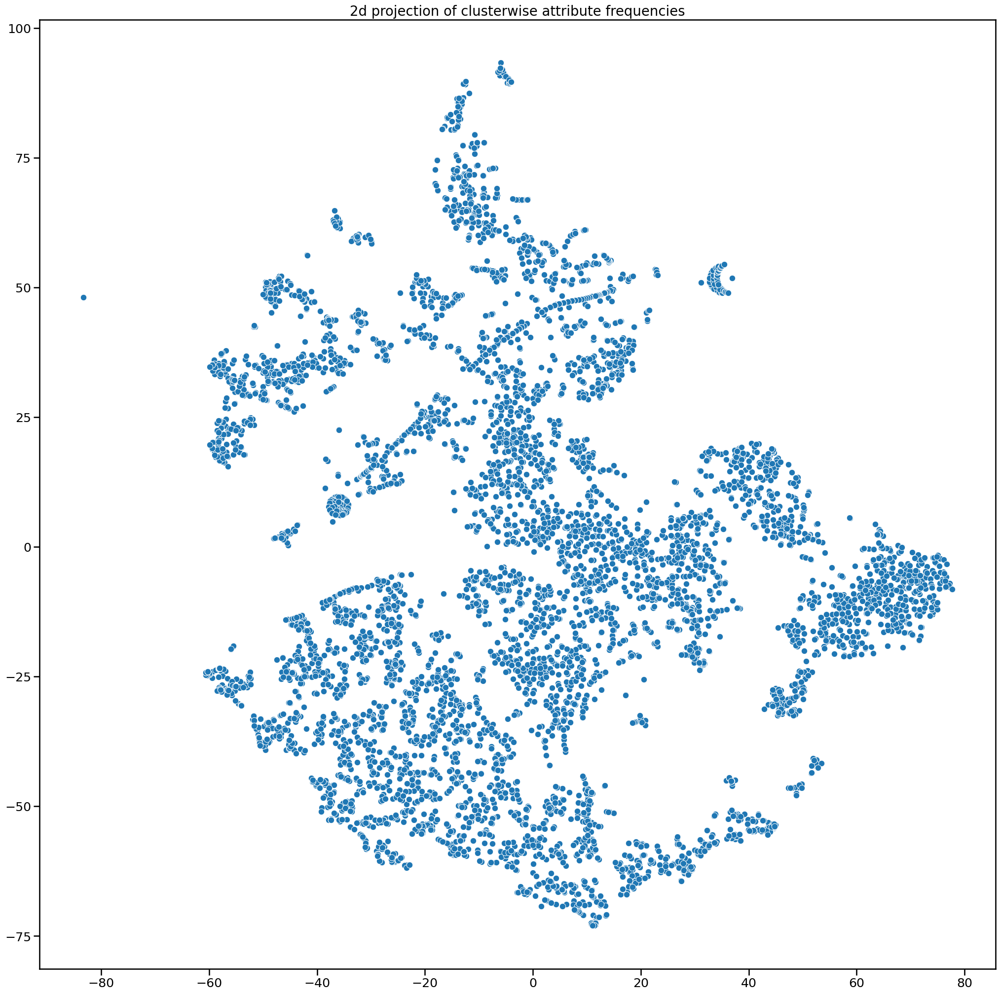

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_context("talk", font_scale=1.1)
plt.figure(figsize=(25,25))
plt.title('2d projection of clusterwise attribute frequencies')
sns.scatterplot(x=X_embedded.T[0], 
                y=X_embedded.T[1])
                #hue=kmeans.labels_,  style=kmeans.labels_,palette = "gist_rainbow",legend= 'full')

In [13]:
from sklearn.cluster import HDBSCAN, KMeans
hdb = HDBSCAN(min_cluster_size= 5)
hdb.fit(atb_freq.values)

HDBSCAN()

In [133]:
clust_atb['SuperClusterLabel'] = hdb.labels_

<Axes: title={'center': '2d projection of clusterwise attribute frequencies'}>

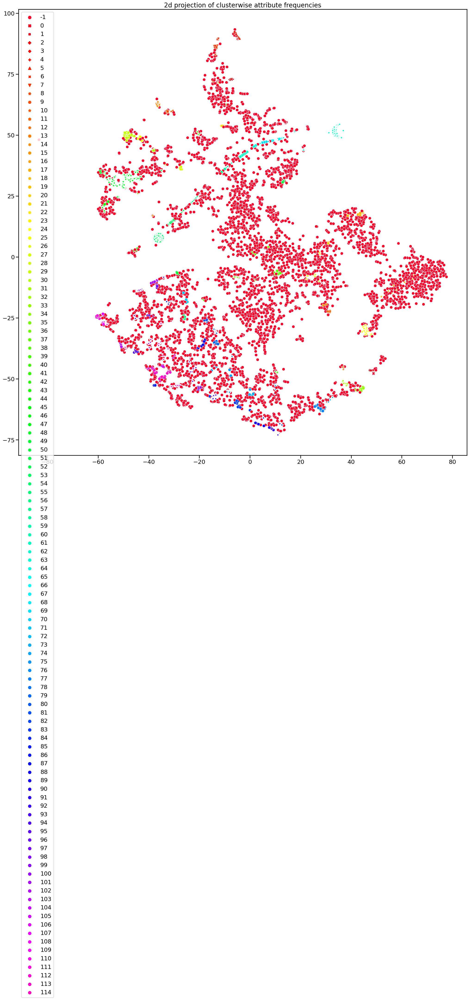

In [16]:
sns.set_context("talk", font_scale=1.1)
plt.figure(figsize=(25,25))
plt.title('2d projection of clusterwise attribute frequencies')
sns.scatterplot(x=X_embedded.T[0], 
                y=X_embedded.T[1],
                hue=hdb.labels_,  style=hdb.labels_,palette = "gist_rainbow",legend= 'full')

In [96]:
#Frequency ranges 
freq_by_atb = atb_freq.describe().T
freq_by_atb = freq_by_atb[freq_by_atb['max'] >0]

In [97]:
freq_by_atb

,count,mean,std,min,25%,50%,75%,max
Method of Sweetening,7158.0,6.192338e-03,0.036710,0.0,0.0,0.0,0.0,0.904762
Level of Sugar/Sucrose/Sweetener Claim,7158.0,9.346532e-03,0.045363,0.0,0.0,0.0,0.0,0.904762
Whole Grains - Contained in Product,7158.0,2.349519e-03,0.019444,0.0,0.0,0.0,0.0,0.904762
Flavor(s),7158.0,4.931994e-03,0.028330,0.0,0.0,0.0,0.0,0.909091
Milk Product/Substitute,7158.0,1.835756e-03,0.016979,0.0,0.0,0.0,0.0,0.600000
...,...,...,...,...,...,...,...,...
Yam and its derivatives,7158.0,2.367861e-06,0.000200,0.0,0.0,0.0,0.0,0.016949
Apple and its derivatives,7158.0,3.968859e-07,0.000034,0.0,0.0,0.0,0.0,0.002841
Lichee Nuts and Their Derivatives,7158.0,1.286407e-07,0.000011,0.0,0.0,0.0,0.0,0.000921
Mango and its derivatives,7158.0,8.898333e-07,0.000075,0.0,0.0,0.0,0.0,0.006369


In [134]:
import ast
clust_atb['Non-Null Attributes'] = clust_atb['Non-Null Attributes'].apply(lambda x: ast.literal_eval(x))
clust_atb['Attribute_Frequency'] = clust_atb.apply(lambda x: dict(zip(x['Non-Null Attributes'],\
                                                                      [i for i in list(x[ClusterLabelClusterLabel'AttributeVector']) if i !=0])), axis = 1)


In [140]:
clust_atb['SuperClusterSize'] = clust_atb.SuperClusterLabel.map(dict(clust_atb.groupby('SuperClusterLabel').size()))

In [142]:
clust_atb[['ClusterLabel','Cluster Name','Cluster Size','Attribute_Frequency','SuperClusterLabel','SuperClusterSize']].to_csv('AttributeFreqSuperClustering_0901.csv', index = None)

In [38]:
df_atbx = clust_itm_atb.copy()
df_atbx.dtypes['ClusterLabel']  # dtype('O')
df_atbx['ClusterLabel'] = df_atbx['ClusterLabel'].astype(int)  # dtype('int32')
#df_atbx['CsterLabel_val'] = df_atbx['ClusterLabel'].apply(lambda x: x.val)

dtype('O')

In [39]:
df_atbx['ClusterLabel'] = df_atbx['ClusterLabel'].astype(int)
df_atbx.dtypes['ClusterLabel']

dtype('int32')

In [42]:
df_atbx.dtypes['ClusterLabel']

dtype('int32')

In [62]:
atb_colz = clust_itm_atb.columns[4:10]
%timeit  resz = pd.DataFrame(df_atb.groupby('ClusterLabel').apply(lambda x:{i: dict(x[i].value_counts()/len(x)) for i in atb_colz})).reset_index()

15.2 s ± 809 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [63]:
resz.shape

(7158, 2)

In [67]:
resz.to_csv(path + 'Clust_Attribute_Distributions_0831_resz_wip.txt', index = None, sep='\t' )

In [68]:
resz.to_excel(path + 'Clust_Attribute_Distributions_0831_resz_wip.xlsx', index = None )

In [53]:
clust_itm_atb['ClusterLabel'].value_counts(dropna = False).sort_index() 


0       1306
1       1145
10       818
100      328
1000      66
1001      66
1002      66
1003      66
1004      66
1005      66
1006      66
1007      66
1008      66
1009      66
101      329
1010      66
1011      66
1012      66
1013      66
1014      66
1015      66
1016      65
1017      65
1018      65
1019      65
102      328
1020      65
1021      65
1022      65
1023      65
1024      65
1025      65
1026      65
1027      64
1028      65
1029      64
103      325
1030      65
1031      65
1032      65
1033      65
1034      65
1035      64
1036      64
1037      64
1038      64
1039      64
104      323
1040      64
1041      64
1042      64
1043      64
1044      64
1045      64
1046      64
1047      64
1048      64
1049      63
105      322
1050      64
1051      64
1052      64
1053      63
1054      63
1055      63
1056      63
1057      63
1058      63
1059      63
106      319
1060      63
1061      63
1062      61
1063      63
1064      63
1065      62
1066      63

In [54]:
clust_itm_atb.shape

(320846, 274)

In [60]:
res_bkup = res.copy()

In [61]:
res.shape

(7158, 2)

In [69]:
res_from_csv = pd.read_csv(path + 'Clust_Attribute_Distributions_0831.csv')

In [70]:
res_from_csv.shape

(7158, 2)

In [72]:
res_freq = res.copy()

In [73]:
res_freq.head()

,ClusterLabel,0
0,0,"{'Method of Sweetening': {}, 'Level of Sugar/S..."
1,1,"{'Method of Sweetening': {}, 'Level of Sugar/S..."
2,10,{'Method of Sweetening': {'SUGAR': 0.097799511...
3,100,"{'Method of Sweetening': {}, 'Level of Sugar/S..."
4,1000,{'Method of Sweetening': {'NONE': 0.0151515151...


In [74]:
list(res[0])

[{'Method of Sweetening': {},
  'Level of Sugar/Sucrose/Sweetener Claim': {},
  'Whole Grains - Contained in Product': {},
  'Flavor(s)': {},
  'Milk Product/Substitute': {},
  'Cheese Product Type': {},
  'Juice Percentage': {},
  'Level of Cooking': {},
  'Genre': {},
  'Color': {'BLUE': 0.1784073506891271,
   'PINK': 0.17457886676875958,
   'MULTI-COLORED': 0.1225114854517611,
   'RED': 0.10643185298621746,
   'BLACK': 0.09494640122511486,
   'GREEN': 0.08346094946401225,
   'YELLOW': 0.04670750382848392,
   'ORANGE': 0.03905053598774885,
   'PURPLE': 0.03215926493108729,
   'GOLD': 0.03139356814701378,
   'BROWN': 0.02986217457886677,
   'TAN': 0.016845329249617153,
   'WHITE': 0.016079632465543645,
   'GRAY': 0.004594180704441042,
   'CREAM': 0.0038284839203675345,
   'SILVER': 0.0015313935681470138,
   'CLEAR': 0.0007656967840735069},
  'Size Description': {'NOT APPLICABLE': 0.0007656967840735069},
  'Card Is Closed Loop': {},
  'Denomination of Card': {},
  'Card Processor': {},

In [75]:
df_freq = pd.DataFrame(list(res[0]))
df_freq.head()

,Method of Sweetening,Level of Sugar/Sucrose/Sweetener Claim,Whole Grains - Contained in Product,Flavor(s),Milk Product/Substitute,Cheese Product Type,Juice Percentage,Level of Cooking,Genre,Color,Size Description,Card Is Closed Loop,Denomination of Card,Card Processor,Card is General Purpose Reloadable (GPR),Value of Card (Fixed or Variable),Other Size Description,Whole Grain Percent,Other Color,Item Bone In,USDA Meat Grade,Type of Processing Required at Store Level,Harvest Type,In Store Prepared/Packaged,Boneless Claim,Intended to be Used as a Topping or Ingredient,Consumer Lifestage,Age Restricted,Rating,Shelf Life of Product without Expiration Date on Package,Recommended Shelf Life Once Seal Broken on Packaging,Floral Container Type,Potted Plant,Shipping Material,Is Item Intended for Human Consumption?,Pot/Planter Size - Liquid Measure,Product is Labeled with an FDA Approved National Drug Code (NDC),Scent,Alcohol Proof,Type of Spirit,Consumer Unit Resealable,Type of Alcoholic Beverage Content,Artist,Other Floral Container Type,Type of Alcoholic Cordial/Syrup,Type of Tobacco,Fee Printed on Card,Variable Denomination of Card Maximum Amount,Minutes on Card,Data Allowance,Type of Airtime Card,Sold only at Kroger Fuel Centers,Type of Phone Card,Card Reloadable,Texts Allowance,Telecom Carrier,Pseudoephedrine (PSE) Amount in package,Type of Beer,Banner Name,ATI_TIP_KIT_ICD_VLU,ASBD_ACU_PDT_HGT_IN_INCH,ASBD_ACU_PDT_LTH_IN_INCH,ASBD_ACU_PDT_WTH_IN_INCH,ASB_REQ_VLU,AVG_WTTG_VLU,BTR_REQ_VLU,BRD_ANM_TYP_VLU,BLM_SSON_VLU,CORD_LTH_TX,FIN_VLU,HIN_ZNE_VLU,LGT_REQ_VLU,MTL_VLU,VND_BRN_NAM,GLU_FRE_CLM_VLU,LVL_OF_NON_GMO_CLM_VLU,MIN_DAYS_OF_SHF_LIF_AT_WHS_DAYS,NET_CONT_EQV_UOM_VIP_TO_KRG_UOM,NON_GMO_PDT_FL,ORG_CLM_VLU,RDM_WGT_FL,CER_FOR_POV_DIET_FL,LIV_NAT_ELG_FL,PDT_FRE_FRO_VLU,SRV_CNT_VLU,SYP_RLF_VLU,TPT_CLS_VLU,INE_USE_OF_PDT_TX,NO_OF_SERV_PER_PKG_NO,SIZ_QY,SNAP_ELG_FL,TYP_OF_LBL_VLU,ALH_FL,HAZ_FL,IS_EDBL_VLU,IS_TPCL_VLU,NUTRI_CALR,SBSP_ITM,KRG_OWN_IS_CHEM_VLU,KRG_OWN_IS_RAW_VLU,SHF_LIF_QY,ASBD_ACU_PDT_WGT_IN_LBS,BGR_ICD_VLU,BTR_ICD_VLU,BTR_TYP_VLU,BPA_FRE_VLU,CPC_IN_OZ,CLX_DSC,CVR_ARA_SQR_FT,FLV_DSC,INDR_OR_OUTD_VLU,MFR_WTY_LTH_OF_TM_IN_MON,NON_STK_VLU,SCT_DSC,TPT_THS_IN_DGE_FEH,TOY_TYP_VLU,VEH_TYP_VLU,ORG_TRD_ITM_VLU,Shellfish,Milk and its Derivatives,Fish and Their Derivatives,Eggs and Their Derivatives,Crustaceans and Their Derivatives,Tree Nuts and Their Derivatives,Sulfur Dioxide and Sulfits,Peanuts and Their Derivatives,Sesame Seeds and Their Derivatives,Soybean and its Derivatives,Wheat and Their Derivatives,Corn and Its Derivatives,Other gluten Containing Grain and Gluten Containing Grain Products,Does Not Contain Declaration Obligatory Allergens,Sunflower Seeds and Their Derivatives,Carrots and Their Derivatives,Celery and its Derivatives,Cereals and Their Derivatives,Barley and Barley Products,Seed Products,Rye and Their Derivatives,Oats,Almond and Almond Products,"CONTAINS TRACES OF TREE NUTS, I.E. ALMONDS, VARIOUS KINDS OF TREE NUTS",Coconuts and Their Derivatives,Lactose,Pod Fruits and Their Derivatives,Molluscs and Their Derivatives,Poppy Seeds and Their Derivatives,Benzyl Alcohol,Anise Alcohol,Amylcinnamyl Alcohol,Cashew and Cashew Products,Cocoa and its Derivatives,Walnut and Walnut Products,Glutamate and Their Derivatives,Mustard and its Derivatives,Pecan Nut and Pecan Nut Products,Macadamia Nut and Macadamia Nut Products,1-Naphthol,Queensland Nut and Queensland Nut Products,Pine Nut and Their Derivatives,Chicken Meat and Their Derivatives,Pork and its Derivatives,Salmon and its Derivatives,Sole and its Derivatives,Hazelnut and Hazelnut Products,Citronellol,Beef and its Derivatives,Lupine and its Derivatives,"1,3-Bis-(2,4-diaminophenoxy)propane",Pistachio and Pistachio Products,Brazil Nut and Brazil Nut Products,d-Limonene,Coumarin,Coriander and its Derivatives,Spelt and Spelt Products,Peas and Pea Products,Kamut,Linalool,Citral,Cod and its Derivatives,Pulses,Triticale and Their Derivatives,Cinnamyl Alcohol,Eugenol,Hexyl 

In [78]:
atb_freq_yue = pd.read_csv(path + 'Clust_Attribute_Frequency_0831_yue.csv')
atb_freq_yue.head()

,Method of Sweetening,Level of Sugar/Sucrose/Sweetener Claim,Whole Grains - Contained in Product,Flavor(s),Milk Product/Substitute,Cheese Product Type,Juice Percentage,Level of Cooking,Genre,Color,Size Description,Card Is Closed Loop,Denomination of Card,Card Processor,Card is General Purpose Reloadable (GPR),Value of Card (Fixed or Variable),Other Size Description,Whole Grain Percent,Other Color,Item Bone In,USDA Meat Grade,Type of Processing Required at Store Level,Harvest Type,In Store Prepared/Packaged,Boneless Claim,Intended to be Used as a Topping or Ingredient,Consumer Lifestage,Age Restricted,Rating,Shelf Life of Product without Expiration Date on Package,Recommended Shelf Life Once Seal Broken on Packaging,Floral Container Type,Potted Plant,Shipping Material,Is Item Intended for Human Consumption?,Pot/Planter Size - Liquid Measure,Product is Labeled with an FDA Approved National Drug Code (NDC),Scent,Alcohol Proof,Type of Spirit,Consumer Unit Resealable,Type of Alcoholic Beverage Content,Artist,Other Floral Container Type,Type of Alcoholic Cordial/Syrup,Type of Tobacco,Fee Printed on Card,Variable Denomination of Card Maximum Amount,Minutes on Card,Data Allowance,Type of Airtime Card,Sold only at Kroger Fuel Centers,Type of Phone Card,Card Reloadable,Texts Allowance,Telecom Carrier,Pseudoephedrine (PSE) Amount in package,Type of Beer,Banner Name,ATI_TIP_KIT_ICD_VLU,ASBD_ACU_PDT_HGT_IN_INCH,ASBD_ACU_PDT_LTH_IN_INCH,ASBD_ACU_PDT_WTH_IN_INCH,ASB_REQ_VLU,AVG_WTTG_VLU,BTR_REQ_VLU,BRD_ANM_TYP_VLU,BLM_SSON_VLU,CORD_LTH_TX,FIN_VLU,HIN_ZNE_VLU,LGT_REQ_VLU,MTL_VLU,VND_BRN_NAM,GLU_FRE_CLM_VLU,LVL_OF_NON_GMO_CLM_VLU,MIN_DAYS_OF_SHF_LIF_AT_WHS_DAYS,NET_CONT_EQV_UOM_VIP_TO_KRG_UOM,NON_GMO_PDT_FL,ORG_CLM_VLU,RDM_WGT_FL,CER_FOR_POV_DIET_FL,LIV_NAT_ELG_FL,PDT_FRE_FRO_VLU,SRV_CNT_VLU,SYP_RLF_VLU,TPT_CLS_VLU,INE_USE_OF_PDT_TX,NO_OF_SERV_PER_PKG_NO,SIZ_QY,SNAP_ELG_FL,TYP_OF_LBL_VLU,ALH_FL,HAZ_FL,IS_EDBL_VLU,IS_TPCL_VLU,NUTRI_CALR,SBSP_ITM,KRG_OWN_IS_CHEM_VLU,KRG_OWN_IS_RAW_VLU,SHF_LIF_QY,ASBD_ACU_PDT_WGT_IN_LBS,BGR_ICD_VLU,BTR_ICD_VLU,BTR_TYP_VLU,BPA_FRE_VLU,CPC_IN_OZ,CLX_DSC,CVR_ARA_SQR_FT,FLV_DSC,INDR_OR_OUTD_VLU,MFR_WTY_LTH_OF_TM_IN_MON,NON_STK_VLU,SCT_DSC,TPT_THS_IN_DGE_FEH,TOY_TYP_VLU,VEH_TYP_VLU,ORG_TRD_ITM_VLU,Shellfish,Milk and its Derivatives,Fish and Their Derivatives,Eggs and Their Derivatives,Crustaceans and Their Derivatives,Tree Nuts and Their Derivatives,Sulfur Dioxide and Sulfits,Peanuts and Their Derivatives,Sesame Seeds and Their Derivatives,Soybean and its Derivatives,Wheat and Their Derivatives,Corn and Its Derivatives,Other gluten Containing Grain and Gluten Containing Grain Products,Does Not Contain Declaration Obligatory Allergens,Sunflower Seeds and Their Derivatives,Carrots and Their Derivatives,Celery and its Derivatives,Cereals and Their Derivatives,Barley and Barley Products,Seed Products,Rye and Their Derivatives,Oats,Almond and Almond Products,"CONTAINS TRACES OF TREE NUTS, I.E. ALMONDS, VARIOUS KINDS OF TREE NUTS",Coconuts and Their Derivatives,Lactose,Pod Fruits and Their Derivatives,Molluscs and Their Derivatives,Poppy Seeds and Their Derivatives,Benzyl Alcohol,Anise Alcohol,Amylcinnamyl Alcohol,Cashew and Cashew Products,Cocoa and its Derivatives,Walnut and Walnut Products,Glutamate and Their Derivatives,Mustard and its Derivatives,Pecan Nut and Pecan Nut Products,Macadamia Nut and Macadamia Nut Products,1-Naphthol,Queensland Nut and Queensland Nut Products,Pine Nut and Their Derivatives,Chicken Meat and Their Derivatives,Pork and its Derivatives,Salmon and its Derivatives,Sole and its Derivatives,Hazelnut and Hazelnut Products,Citronellol,Beef and its Derivatives,Lupine and its Derivatives,"1,3-Bis-(2,4-diaminophenoxy)propane",Pistachio and Pistachio Products,Brazil Nut and Brazil Nut Products,d-Limonene,Coumarin,Coriander and its Derivatives,Spelt and Spelt Products,Peas and Pea Products,Kamut,Linalool,Citral,Cod and its Derivatives,Pulses,Triticale and Their Derivatives,Cinnamyl Alcohol,Eugenol,Hexyl 

In [82]:
atb_colz = clust_itm_atb.columns[4:10]
res_freq_yue = pd.DataFrame(clust_itm_atb.groupby('ClusterLabel').apply(lambda x:{i: len(x[i].dropna())/len(x) for i in atb_colz})).reset_index()
res_freq_yue.head()

,ClusterLabel,0
0,0,"{'Method of Sweetening': 0.0, 'Level of Sugar/..."
1,1,"{'Method of Sweetening': 0.0, 'Level of Sugar/..."
2,10,"{'Method of Sweetening': 0.1234718826405868, '..."
3,100,"{'Method of Sweetening': 0.0, 'Level of Sugar/..."
4,1000,"{'Method of Sweetening': 0.015151515151515152,..."


In [90]:
list(atb_freq.values)

[array(['PARTY EVERYDAY,NOVELTY AND DECOR,GIFT-WRAP SEASONAL,SPECIAL EVERYDAY',
        1306, 0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.983154671,
        0.000765697, 0.0, 0.0, 0.0, 0.0, 0.0, 0.000765697, 0.0,
        0.000765697, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
        0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
        0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
        0.0, 0.0, 0.0, 0.0, 0.029862175, 0.012251149, 0.029862175,
        0.000765697, 0.0, 0.0, 0.0, 0, 0.0, 0.0, 0, 0.0, 0.619448698,
        0.004594181, 0.0, 0.0, 0.0, 0.005359877, 0.0, 0.0, 0.004594181,
        0.0, 0.900459418, 0.0, 0.0, 0.0, 0.004594181, 0.0, 0.0,
        0.006891271, 0.000765697, 0.003828484, 1.0, 0.0, 0.996937213,
        0.996937213, 0.0, 0, 0.0, 0.0, 0.0, 0.011485452, 0, 0.0, 0.0, 0.0,
        0.0, 0.006125574, 0.0, 0.0, 0.003828484, 0.000765697, 0.0, 0.0,
        0.0, 0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

In [91]:
atb_freq.head()

,Cluster Name,Cluster Size,ClusterLabel,Level of Sugar/Sucrose/Sweetener Claim,Whole Grains - Contained in Product,Flavor(s),Milk Product/Substitute,Cheese Product Type,Juice Percentage,Level of Cooking,Genre,Color,Size Description,Card Is Closed Loop,Denomination of Card,Card Processor,Card is General Purpose Reloadable (GPR),Value of Card (Fixed or Variable),Other Size Description,Whole Grain Percent,Other Color,Item Bone In,USDA Meat Grade,Type of Processing Required at Store Level,Harvest Type,In Store Prepared/Packaged,Boneless Claim,Intended to be Used as a Topping or Ingredient,Consumer Lifestage,Age Restricted,Rating,Shelf Life of Product without Expiration Date on Package,Recommended Shelf Life Once Seal Broken on Packaging,Floral Container Type,Potted Plant,Shipping Material,Is Item Intended for Human Consumption?,Pot/Planter Size - Liquid Measure,Product is Labeled with an FDA Approved National Drug Code (NDC),Scent,Alcohol Proof,Type of Spirit,Consumer Unit Resealable,Type of Alcoholic Beverage Content,Artist,Other Floral Container Type,Type of Alcoholic Cordial/Syrup,Type of Tobacco,Fee Printed on Card,Variable Denomination of Card Maximum Amount,Minutes on Card,Data Allowance,Type of Airtime Card,Sold only at Kroger Fuel Centers,Type of Phone Card,Card Reloadable,Texts Allowance,Telecom Carrier,Pseudoephedrine (PSE) Amount in package,Type of Beer,Banner Name,ATI_TIP_KIT_ICD_VLU,ASBD_ACU_PDT_HGT_IN_INCH,ASBD_ACU_PDT_LTH_IN_INCH,ASBD_ACU_PDT_WTH_IN_INCH,ASB_REQ_VLU,AVG_WTTG_VLU,BTR_REQ_VLU,BRD_ANM_TYP_VLU,BLM_SSON_VLU,CORD_LTH_TX,FIN_VLU,HIN_ZNE_VLU,LGT_REQ_VLU,MTL_VLU,VND_BRN_NAM,GLU_FRE_CLM_VLU,LVL_OF_NON_GMO_CLM_VLU,MIN_DAYS_OF_SHF_LIF_AT_WHS_DAYS,NET_CONT_EQV_UOM_VIP_TO_KRG_UOM,NON_GMO_PDT_FL,ORG_CLM_VLU,RDM_WGT_FL,CER_FOR_POV_DIET_FL,LIV_NAT_ELG_FL,PDT_FRE_FRO_VLU,SRV_CNT_VLU,SYP_RLF_VLU,TPT_CLS_VLU,INE_USE_OF_PDT_TX,NO_OF_SERV_PER_PKG_NO,SIZ_QY,SNAP_ELG_FL,TYP_OF_LBL_VLU,ALH_FL,HAZ_FL,IS_EDBL_VLU,IS_TPCL_VLU,NUTRI_CALR,SBSP_ITM,KRG_OWN_IS_CHEM_VLU,KRG_OWN_IS_RAW_VLU,SHF_LIF_QY,ASBD_ACU_PDT_WGT_IN_LBS,BGR_ICD_VLU,BTR_ICD_VLU,BTR_TYP_VLU,BPA_FRE_VLU,CPC_IN_OZ,CLX_DSC,CVR_ARA_SQR_FT,FLV_DSC,INDR_OR_OUTD_VLU,MFR_WTY_LTH_OF_TM_IN_MON,NON_STK_VLU,SCT_DSC,TPT_THS_IN_DGE_FEH,TOY_TYP_VLU,VEH_TYP_VLU,ORG_TRD_ITM_VLU,Shellfish,Milk and its Derivatives,Fish and Their Derivatives,Eggs and Their Derivatives,Crustaceans and Their Derivatives,Tree Nuts and Their Derivatives,Sulfur Dioxide and Sulfits,Peanuts and Their Derivatives,Sesame Seeds and Their Derivatives,Soybean and its Derivatives,Wheat and Their Derivatives,Corn and Its Derivatives,Other gluten Containing Grain and Gluten Containing Grain Products,Does Not Contain Declaration Obligatory Allergens,Sunflower Seeds and Their Derivatives,Carrots and Their Derivatives,Celery and its Derivatives,Cereals and Their Derivatives,Barley and Barley Products,Seed Products,Rye and Their Derivatives,Oats,Almond and Almond Products,"CONTAINS TRACES OF TREE NUTS, I.E. ALMONDS, VARIOUS KINDS OF TREE NUTS",Coconuts and Their Derivatives,Lactose,Pod Fruits and Their Derivatives,Molluscs and Their Derivatives,Poppy Seeds and Their Derivatives,Benzyl Alcohol,Anise Alcohol,Amylcinnamyl Alcohol,Cashew and Cashew Products,Cocoa and its Derivatives,Walnut and Walnut Products,Glutamate and Their Derivatives,Mustard and its Derivatives,Pecan Nut and Pecan Nut Products,Macadamia Nut and Macadamia Nut Products,1-Naphthol,Queensland Nut and Queensland Nut Products,Pine Nut and Their Derivatives,Chicken Meat and Their Derivatives,Pork and its Derivatives,Salmon and its Derivatives,Sole and its Derivatives,Hazelnut and Hazelnut Products,Citronellol,Beef and its Derivatives,Lupine and its Derivatives,"1,3-Bis-(2,4-diaminophenoxy)propane",Pistachio and Pistachio Products,Brazil Nut and Brazil Nut Products,d-Limonene,Coumarin,Coriander and its Derivatives,Spelt and Spelt Products,Peas and Pea Products,Kamut,Linalool,Citral,Cod and its Derivatives,Pulses,Triticale and Their Derivatives,Cinnamyl Alco

In [81]:
res_freq_yue

NameError: name 'res_freq_yue' is not defined